# Notebook to look into the kwyk uncertainty of T1 images across the HBN dataset

In [5]:
import nilearn as nl
from nilearn import plotting, image, masking
import json
import numpy as np
import nibabel as nb
import pandas as pd
import glob
import os
import json
import matplotlib.pyplot as plt

## COUNT how many a) overall b) in each class have uncertainty > 0.4

In [2]:
# list of all subjects 

In [3]:
merged_qc = pd.read_csv('../data/merged_qc.csv', index_col=False)

### get the uncertainty value for each subject

In [4]:
#for df in [merged_qc, asd_qc, control_qc, other_qc]:
df=merged_qc
#    print(f'{df}')
#df_name = [name for name in globals() if globals()[name] is df][0]
#print(f"{df_name}")

print( 'all listed:               ',len(df))
print( 'with t1:                  ', len(df[(df['t1_exists'] == 1)]) )
print( 'max FD <2.4:              ', df[df['max_fd'] < 2.4].shape[0])
print( 'uncertainty <=0.4:        ', df[df['uncertainty'] <= 0.4 ].shape[0])
print( 'uncertainty masked <=0.4: ', df[df['uncertainty_masked'] <= 0.4 ].shape[0])

print( 'remaining:               ', len(df[(df['t1_exists'] == 1) & (df['max_fd'] < 2.4) & (df['uncertainty_masked'] <= 0.4)]))
print( '\n')


all listed:                4264
with t1:                   4229
max FD <2.4:               1519
uncertainty <=0.4:         2584
uncertainty masked <=0.4:  2932
remaining:          1398




In [5]:
# get list of asd subject ids with t1s and with uncertainty >0.4

select_df = df[
    (
        (df['Autism Spectrum Disorder'] == 1) | 
        (df['No Diagnosis Given'] == 1)
    ) & 
    (df['t1_exists'] == 1) & 
    (df['uncertainty_masked'] >= 0.4)
]
len(select_df)

214

In [6]:
unique_sub_df = select_df[['sub', 'uncertainty']].drop_duplicates()
#unique_sub_df = unique_sub_df[['sub', 'uncertainty']]
len(unique_sub_df)

113

In [7]:
unique_sub_df.to_csv('../../temp_uncertainty.csv', index=False, header=False)


In [8]:
unique_sub_df[:2]

,sub,uncertainty
1,NDARAA947ZG5,0.450543
24,NDARAD615WLJ,0.406608


In [9]:
plt.ioff()
for index, row in unique_sub_df.iterrows():
    #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*_bold.nii.gz'
    sub=row["sub"]
    file_path=f'../../temp_uncertainty/{sub}.png'

    if os.path.exists(file_path):
        print(f"The file {file_path} exists.")
        continue
    else:
        #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*fsLR_den-91k_bold.dtseries.nii'
        img_t1_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{sub}/ses-*/anat/sub-{sub}_ses-*_T1w.nii.gz'
    
        
        matching_files = glob.glob(img_t1_file)
        filtered_item = [item for item in matching_files if 'space' not in item]
    
        img_t1=filtered_item[0]
        # if matching_files:
        #     #print(f"{t1_file} exists")
        #     #print(matching_files[0])
        #     fmriprep_subjects.append(row["sub"])
            
            
            
            
            
                
        #sub='NDARWW005GCU'
        #img_t1=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{sub}/ses-*/anat/sub-{sub}_ses-*_T1w.nii.gz'
        #plotting.plot_img(img_t1)
        img_entropy=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_entropy.nii.gz'
        #plotting.plot_img(img_entropy)
        img_label=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_means.nii.gz'
        #plotting.plot_img(img_label)
        
        fig, axes = plt.subplots(3, 1, figsize=(10, 11), facecolor='black')
        display0=plotting.plot_img(img_t1, cmap=plt.cm.gray, cut_coords=(10,-5,10) ,axes=axes[0], black_bg=True,title=f'{sub}')
        
        display1 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[1])
        display1.add_overlay(img_entropy, cmap='hot', vmin=0, vmax=5)
        
        display2 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[2])
        display2.add_overlay(img_label, cmap='gist_rainbow')
        
        fig.savefig(f'../../temp_uncertainty/{sub}.png', facecolor=fig.get_facecolor(), bbox_inches='tight')
        plt.close()


/om2/user/jsmentch/anaconda/envs/hbn_asd/lib/python3.11/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/om2/user/jsmentch/anaconda/envs/hbn_asd/lib/python3.11/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/om2/user/jsmentch/anaconda/envs/hbn_asd/lib/python3.11/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/om2/user/jsmentch/anaconda/envs/hbn_asd/lib/python3.11/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,
/om2/user/jsmentch/anaconda/envs/hbn_asd/lib/python3.11/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


### plot the pilots

In [2]:
# Read lines from the first file
with open('pilots_ru_dm_list.txt', 'r') as file1:
    list1 = file1.readlines()

# Read lines from the second file
with open('pilots2_ru_dm_list.txt', 'r') as file2:
    list2 = file2.readlines()

# Optionally, strip newlines and combine the lists if desired
list1 = [line.strip() for line in list1]
list2 = [line.strip() for line in list2]

# Combine both lists into one (if needed)
combined_list = list1 + list2

In [11]:
r2_list=[]
for sub in combined_list:
    loaded=np.load(f'../good_pilots_new/sub-{sub}_roi-a4a5_feat-manualhrf_srp05_delay-0.npz')
    r2_list.append(np.mean(loaded['stacked_r2s']))

In [17]:
#plot the plot with the uncertainty and the r2 score

plt.ioff()
for sub in combined_list:
    #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*_bold.nii.gz'
    # sub=row["sub"]
    loaded=np.load(f'../good_pilots_new/sub-{sub}_roi-a4a5_feat-manualhrf_srp05_delay-0.npz')
    r2=np.mean(loaded['stacked_r2s'])

    uncertainty_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_uncertainty_masked.txt'
    with open(uncertainty_file, 'r') as file:
        uncertainty = float(file.read().strip())
    
    file_path=f'../../temp_uncertainty_pilots/{sub}.png'

    # if os.path.exists(file_path):
    #     print(f"The file {file_path} exists.")
    #     continue
    # else:
    #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*fsLR_den-91k_bold.dtseries.nii'
    img_t1_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{sub}/ses-*/anat/sub-{sub}_ses-*_T1w.nii.gz'

    matching_files = glob.glob(img_t1_file)
    filtered_item = [item for item in matching_files if 'space' not in item]

    img_t1=filtered_item[0]

    img_entropy=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_entropy.nii.gz'
    img_label=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_means.nii.gz'
    
    fig, axes = plt.subplots(3, 1, figsize=(10, 11), facecolor='black')
    display0=plotting.plot_img(img_t1, cmap=plt.cm.gray, cut_coords=(10,-5,10) ,axes=axes[0], black_bg=True,title=f'{sub}, R$^2$={r2:.2f}, unc={uncertainty:.2f}')
    
    display1 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[1])
    display1.add_overlay(img_entropy, cmap='hot', vmin=0, vmax=5)
    
    display2 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[2])
    display2.add_overlay(img_label, cmap='gist_rainbow')
    
    fig.savefig(file_path, facecolor=fig.get_facecolor(), bbox_inches='tight')
    plt.close()



In [18]:
r2_list=[]
uncertainty_list=[]

for sub in combined_list:
    loaded=np.load(f'../good_pilots_new/sub-{sub}_roi-a4a5_feat-manualhrf_srp05_delay-0.npz')
    r2_list.append(np.mean(loaded['stacked_r2s']))

    uncertainty_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_uncertainty_masked.txt'
    with open(uncertainty_file, 'r') as file:
        uncertainty_list.append(float(file.read().strip()))


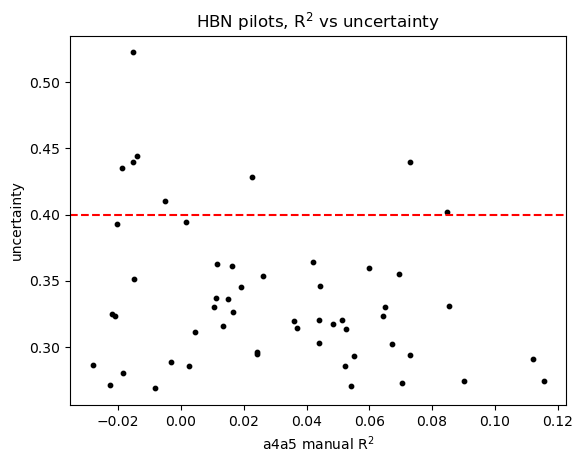

In [31]:
plt.ion()
plt.scatter(r2_list, uncertainty_list,s=10,c='k')
plt.axhline(y=0.4, color='r', linestyle='--')
plt.xlabel(r'a4a5 manual R$^2$')
plt.ylabel('uncertainty')
plt.title(r'HBN pilots, R$^2$ vs uncertainty')

# Display the plot
plt.show()



plt.show()

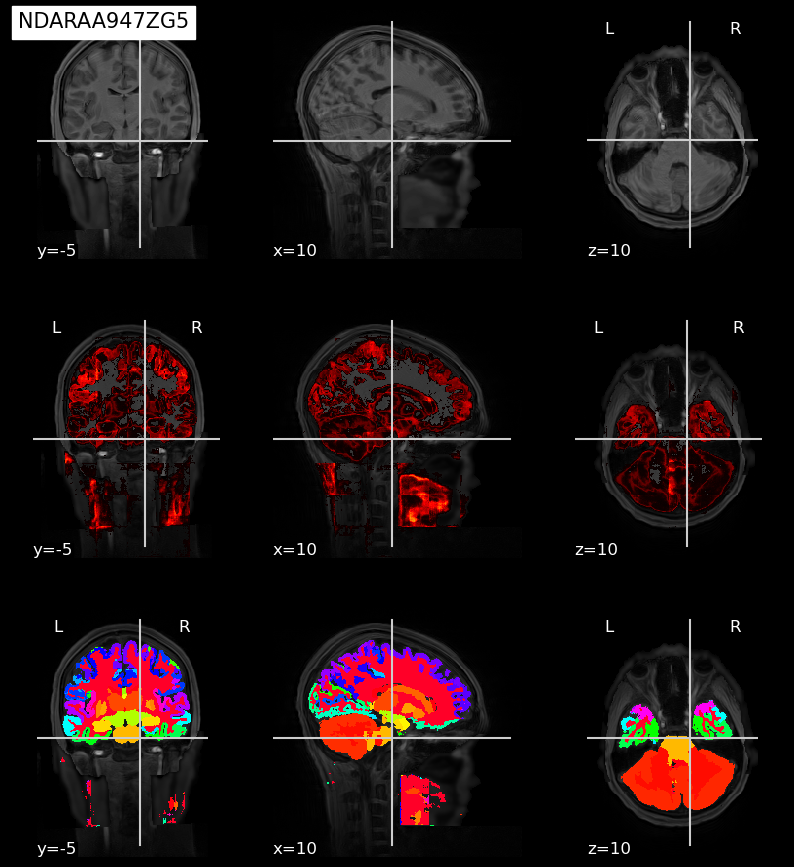

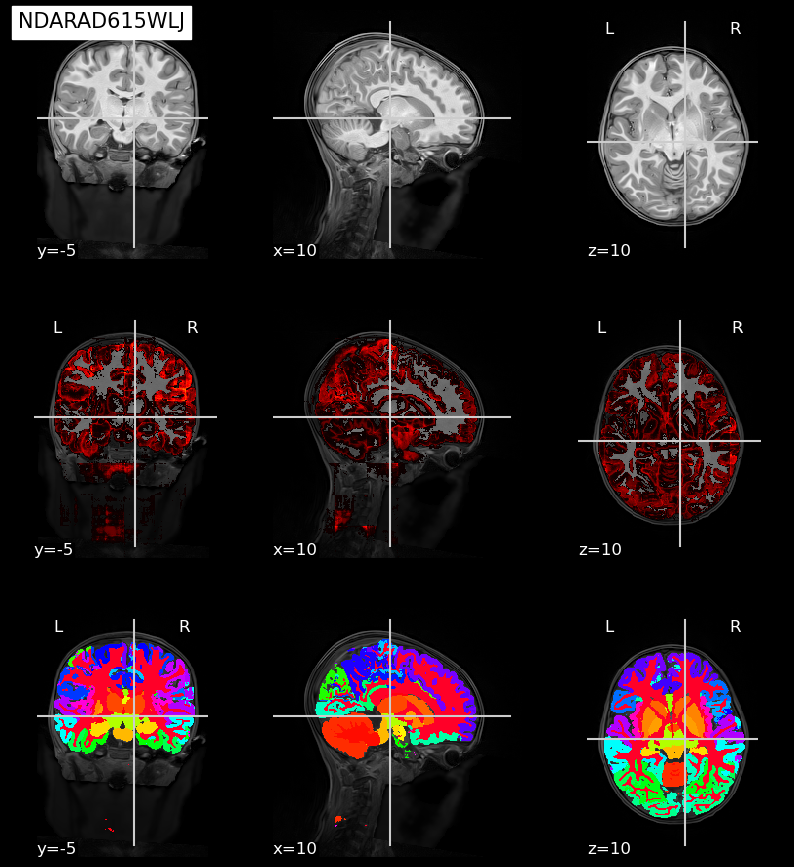

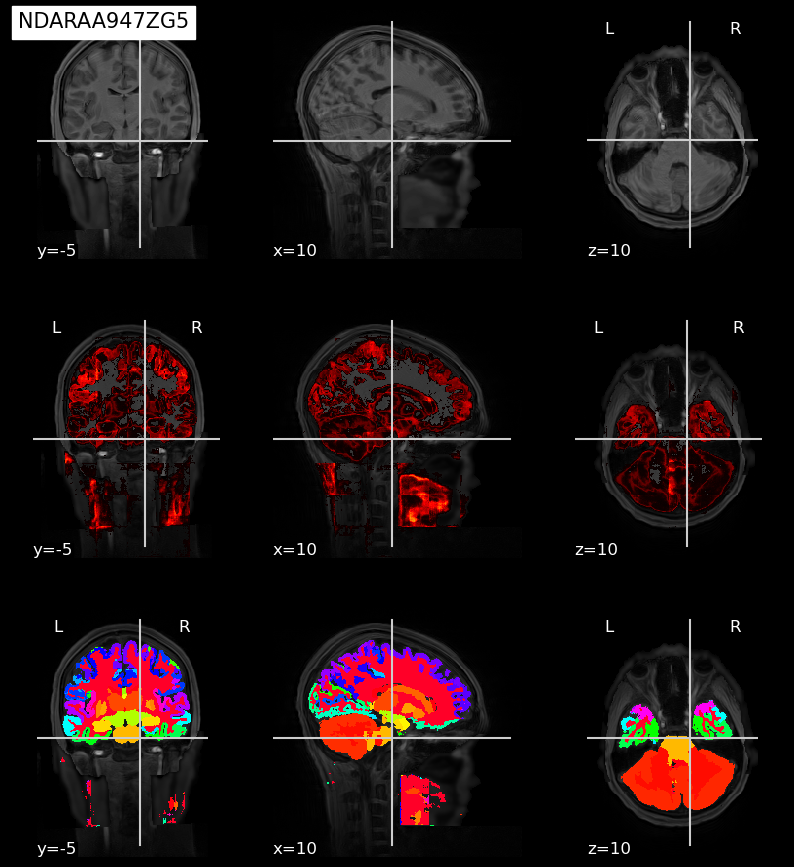

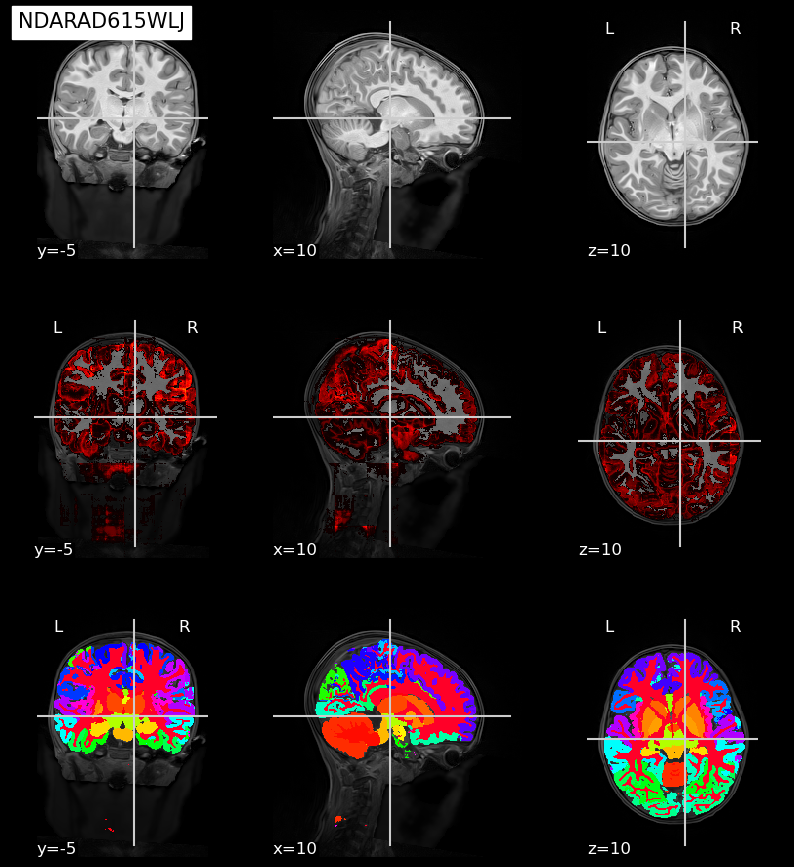

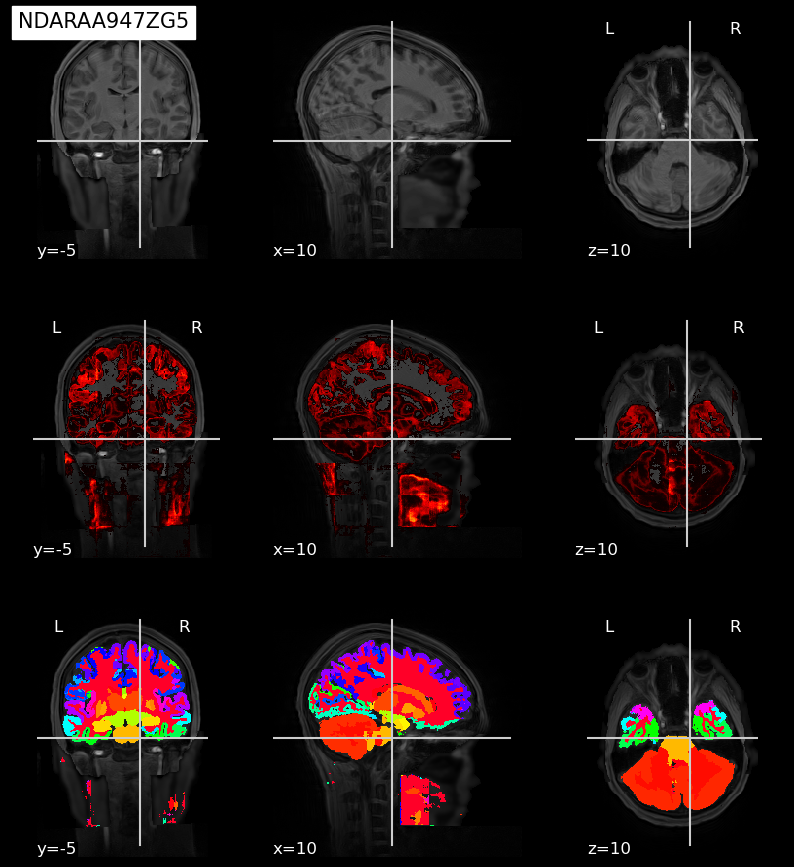

...

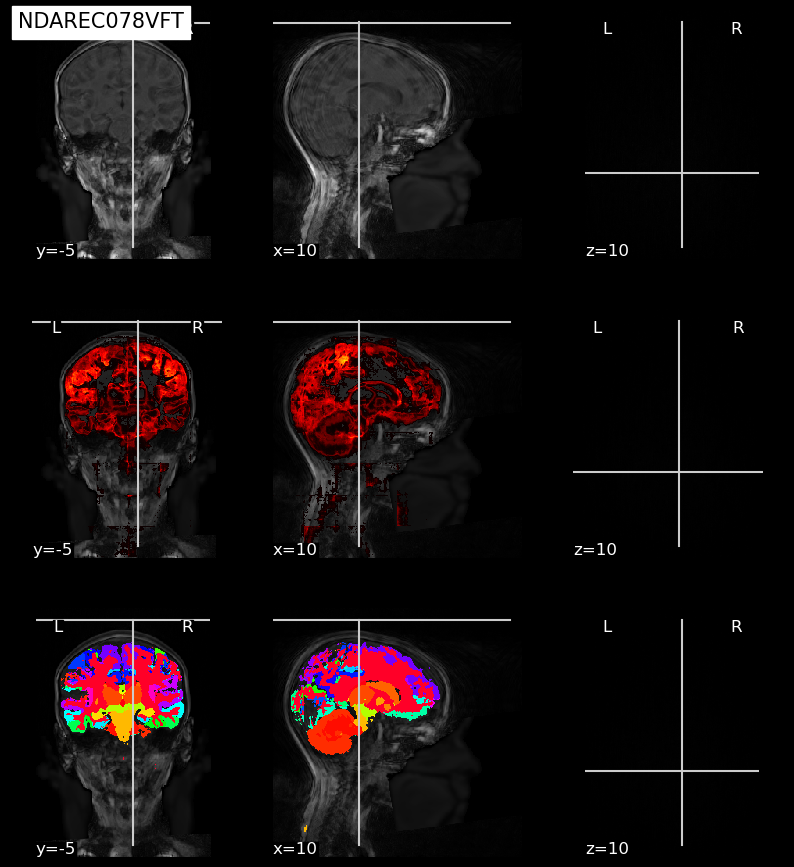

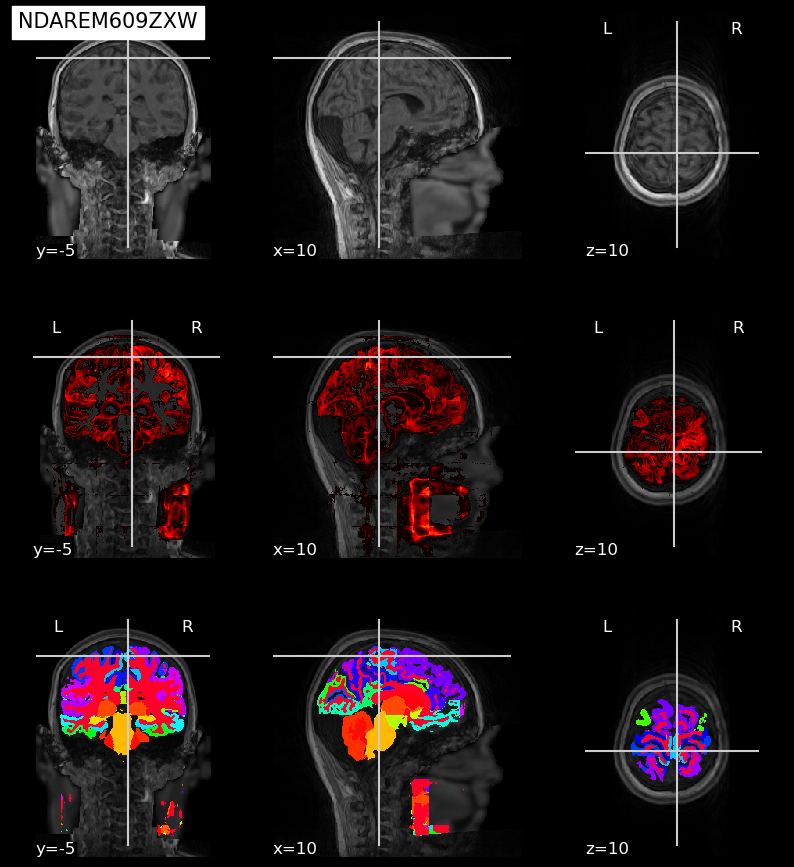

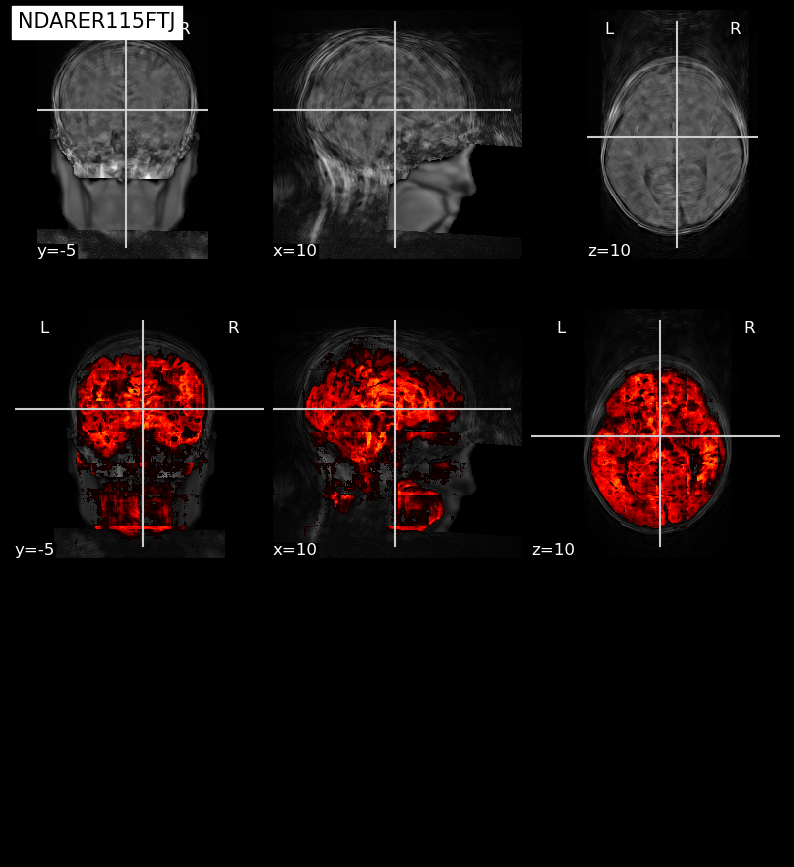

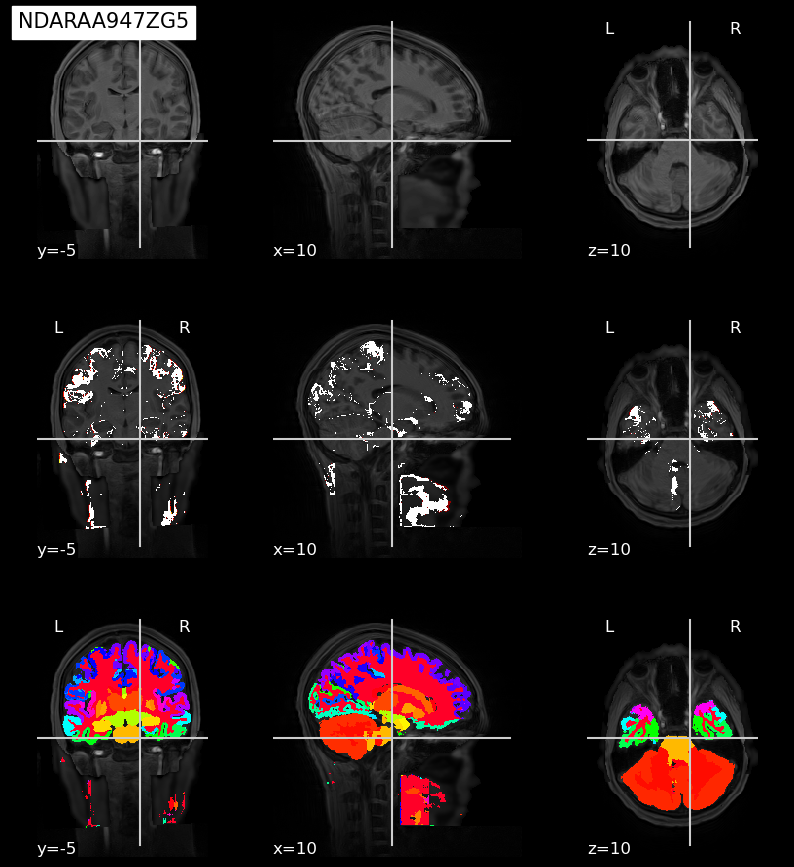

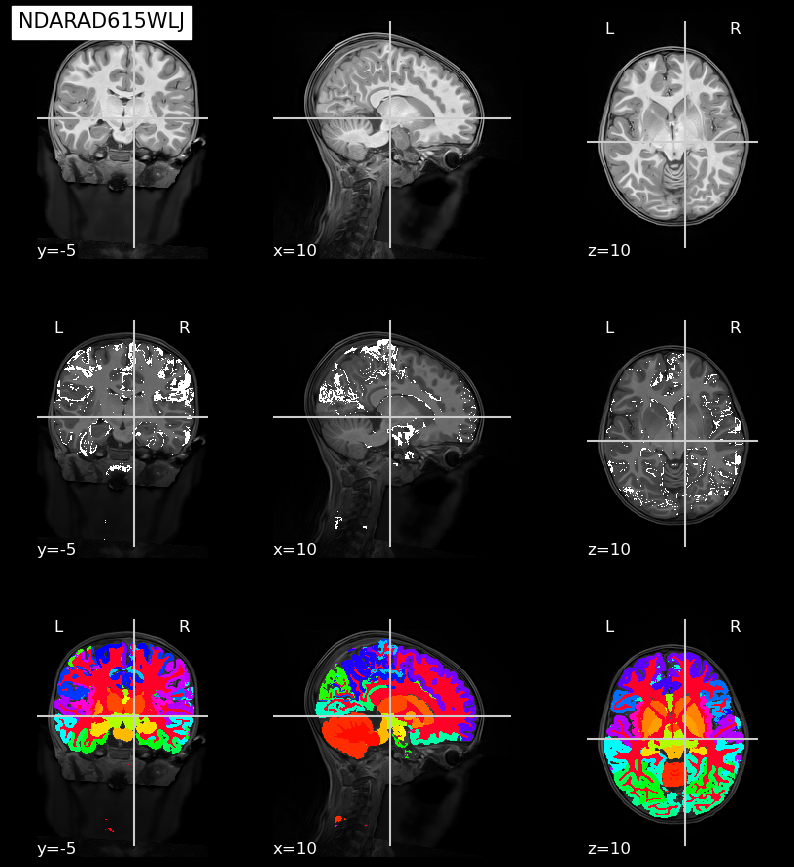

In [82]:
plt.ion()

for index, row in unique_sub_df[:2].iterrows():
    #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*_bold.nii.gz'
    sub=row["sub"]
    file_path=f'../../temp_uncertainty/{sub}.png'

    # if os.path.exists(file_path):
    #     print(f"The file {file_path} exists.")
    #     continue
    # else:
        
    #fmri_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{row["sub"]}/ses-{row["ses"]}/func/sub-{row["sub"]}_ses-{row["ses"]}_*fsLR_den-91k_bold.dtseries.nii'
    img_t1_file=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{sub}/ses-*/anat/sub-{sub}_ses-*_T1w.nii.gz'

    
    matching_files = glob.glob(img_t1_file)
    filtered_item = [item for item in matching_files if 'space' not in item]

    img_t1=filtered_item[0]
    # if matching_files:
    #     #print(f"{t1_file} exists")
    #     #print(matching_files[0])
    #     fmriprep_subjects.append(row["sub"])
        
        
        
        
        
            
    #sub='NDARWW005GCU'
    #img_t1=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/fmriprep_23.2.0/sub-{sub}/ses-*/anat/sub-{sub}_ses-*_T1w.nii.gz'
    #plotting.plot_img(img_t1)
    img_entropy=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_entropy_orig.nii.gz'
    #plotting.plot_img(img_entropy)
    img_label=f'/nese/mit/group/sig/projects/hbn/hbn_bids/derivatives/kwyk/{sub}_means_orig.nii.gz'
    #plotting.plot_img(img_label)
    
    fig, axes = plt.subplots(3, 1, figsize=(10, 11), facecolor='black')
    display0=plotting.plot_img(img_t1, cmap=plt.cm.gray, cut_coords=(10,-5,10) ,axes=axes[0], black_bg=True,title=f'{sub}')
    
    display1 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[1])
    display1.add_overlay(img_entropy, cmap='hot', vmin=0, vmax=5)
    
    display2 = plotting.plot_anat(img_t1, display_mode='ortho', cut_coords=(10,-5,10),axes=axes[2])
    display2.add_overlay(img_label, cmap='gist_rainbow')
    
    #fig.savefig(f'../../temp_uncertainty/{sub}.png', facecolor=fig.get_facecolor(), bbox_inches='tight')
    #plt.close()


In [2]:
## first look at pilots

In [3]:
## next look at ASD, Controls